# Tutorial for MERFISH FCandS dataset
Need additional packages: scanpy seaborn networkx

### Load the packages

In [ ]:
import os
import time
import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score, f1_score

from Harmonics import *

import warnings
warnings.filterwarnings("ignore")

sc.settings.verbosity = 0
sc.settings.set_figure_params(dpi=50, dpi_save=500)

from matplotlib import rcParams
rcParams["figure.dpi"] = 50
rcParams["savefig.dpi"] = 500

### Specify the data and save path

In [2]:
data_dir = '../../../Data/Spatial/Transcriptomics/MERFISH_FCandS_Allen2023/processed/'
save_dir = f'../../results/MERFISH_FCandS_Allen2023/Harmonics/'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

Define a function to match the niche label to ground truth annotation and a function to change p values to corresponding star representation, used to show the results of additional tests implemented in Harmonics.

In [3]:
import numpy as np
import pandas as pd
import networkx as nx

def match_cluster_labels(true_labels, est_labels):
    true_labels_arr = np.array(list(true_labels))
    est_labels_arr = np.array(list(est_labels))

    org_cat = list(np.sort(list(pd.unique(true_labels))))
    est_cat = list(np.sort(list(pd.unique(est_labels))))

    B = nx.Graph()
    B.add_nodes_from([i + 1 for i in range(len(org_cat))], bipartite=0)
    B.add_nodes_from([-j - 1 for j in range(len(est_cat))], bipartite=1)

    for i in range(len(org_cat)):
        for j in range(len(est_cat)):
            weight = np.sum((true_labels_arr == org_cat[i]) * (est_labels_arr == est_cat[j]))
            B.add_edge(i + 1, -j - 1, weight=-weight)

    match = nx.algorithms.bipartite.matching.minimum_weight_full_matching(B)

    if len(org_cat) >= len(est_cat):
        return np.array([match[-est_cat.index(c) - 1] - 1 for c in est_labels_arr])
    else:
        unmatched = [c for c in est_cat if not (-est_cat.index(c) - 1) in match.keys()]
        l = []
        for c in est_labels_arr:
            if (-est_cat.index(c) - 1) in match:
                l.append(match[-est_cat.index(c) - 1] - 1)
            else:
                l.append(len(org_cat) + unmatched.index(c))
        return np.array(l)
    
    
def p2stars(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''

### Load dataset
This dataset includes three groups: 4-week-old group, 24-week-old group, 90-week-old group.

Set *age* to "4wk", "24wk", "90wk" to load data from an individual group. 

The domain annotated as "brain ventricle" is removed due to its low proportion.

In [ ]:
age = '90wk'
slice_name_list = np.loadtxt(data_dir + f"slice_name_list_{age}.txt", dtype=str, delimiter=" ").tolist()

adata_list = []
for slice_name in slice_name_list:
    adata = ad.read_h5ad(data_dir + slice_name + '.h5ad')
    adata = adata[adata.obs['domain_annotation'] != 'brain ventricle', :].copy()
    adata_list.append(adata)

### Run model

Instantiate Harmonics

In [ ]:
iter = 0
model = Harmonics_Model(adata_list,  # the list of AnnData objects
                        slice_name_list,  # the list of slice names
                        concat_label='slice_name',  # the label in .obs to indicate different slices
                        seed=1234+iter,  # random seed
                        parallel=True,  # default 
                        verbose=True,  # default
                        )

Dataset comprises 13 slices, 162844 cells/spots in total.


Preprocess the data (Generating the connection graph and calculating neighborhood cell type destribution for cells)

In [ ]:
model.preprocess(ct_key='celltype_43',  # the label in .obs to indicate cell types
                 spatial_key='spatial',  # default
                 method='joint',  # default
                 n_step=3,  # default
                 n_neighbors=20,  # default
                 cut_percentage=99,  # default
                 )

Generating Delaunay neighbor graph...


100%|██████████| 13/13 [00:01<00:00,  7.50it/s]


All done!

Performing graph completion...


100%|██████████| 13/13 [00:13<00:00,  1.05s/it]


All done!

The cell types of interest are:
Astro-1
Astro-2
Endo-1
Endo-2
Endo-3
Epen
ExN-L2/3-1
ExN-L2/3-2
ExN-L5-1
ExN-L5-2
ExN-L5-3
ExN-L6-1
ExN-L6-2
ExN-L6-3
ExN-Olf
InN-Calb2-1
InN-Calb2-2
InN-Chat
InN-Lamp5
InN-Lhx6
InN-Olf-1
InN-Olf-2
InN-Pvalb-1
InN-Pvalb-2
InN-Pvalb-3
InN-Sst-1
InN-Sst-2
InN-Vip
MSN-D1-1
MSN-D1-2
MSN-D2
Macro
Micro-1
Micro-2
Micro-3
OPC
Olig-1
Olig-2
Olig-3
Peri-1
Peri-2
T cell
Vlmc

Generating one-hot matrix...


100%|██████████| 13/13 [00:00<00:00, 57.15it/s]


All done!

Dataset comprises 43 cell types.

Calculating cell type distribution for microenvironments...
Microenvironments comprise 41.44 cells/spots on average. 
Minimum: 20, Maximum: 78



Perform overclustered initialization on the cell type distributions of cell neighborhoods. Resulting in *Qmax* niches. The distributions of niches are also computed.

In [ ]:
model.initialize_clusters(dim_reduction=True,  # default
                          explained_var=None,  # default
                          n_components=None,  # default
                          n_components_max=100,  # default
                          standardize=True,  # default
                          method='kmeans',  # default 
                          Qmax=20,  # default  
                          )

Performing dimension reduction...
Returning 43 principal components.

Initializing niches...
20 initial niches defined.



Perform hierarchical distribution matching to reduce the niche number to no more than *Qmin*. This step results in niche assignment under a sequence of different niche numbers (usually from *Qmax* to *Qmin*).

In [ ]:
model.hier_dist_match(assign_metric='jsd',  # default
                      weighted_merge=True,  # default
                      max_iters=100,  # default 
                      tol=1e-4,  # default 
                      test_kmeans=False,  # default
                      Qmin=2,  # default
                      )

Starting from 20 cell niches...

Assigning cells to cell niche...
Current state: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]


 61%|██████    | 61/100 [00:23<00:15,  2.56it/s]


Converge at iteration 62.
20 cell niches left.
Merging cell niche 17 and cell niche 19...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]


 11%|█         | 11/100 [00:04<00:32,  2.71it/s]


Converge at iteration 12.
19 cell niches left.
Merging cell niche 5 and cell niche 6...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]


 18%|█▊        | 18/100 [00:06<00:28,  2.93it/s]


Converge at iteration 19.
18 cell niches left.
Merging cell niche 16 and cell niche 13...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18]


 10%|█         | 10/100 [00:04<00:38,  2.35it/s]


Converge at iteration 11.
17 cell niches left.
Merging cell niche 9 and cell niche 14...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 15, 16, 17, 18]


 50%|█████     | 50/100 [00:15<00:15,  3.21it/s]


Distribution of cell niches (centers) converge at iteration 51.
16 cell niches left.
Merging cell niche 3 and cell niche 9...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 2, 3, 4, 5, 7, 8, 10, 11, 12, 15, 16, 17, 18]


 30%|███       | 30/100 [00:09<00:21,  3.32it/s]


Distribution of cell niches (centers) converge at iteration 31.
15 cell niches left.
Merging cell niche 15 and cell niche 3...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 2, 4, 5, 7, 8, 10, 11, 12, 15, 16, 17, 18]


 33%|███▎      | 33/100 [00:09<00:19,  3.38it/s]


Converge at iteration 34.
14 cell niches left.
Merging cell niche 7 and cell niche 15...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 2, 4, 5, 7, 8, 10, 11, 12, 16, 17, 18]


 19%|█▉        | 19/100 [00:05<00:23,  3.48it/s]


Distribution of cell niches (centers) converge at iteration 20.
13 cell niches left.
Merging cell niche 5 and cell niche 7...
Done!

Assigning cells to cell niche...
Current state: [0, 1, 2, 4, 5, 8, 10, 11, 12, 16, 17, 18]


 10%|█         | 10/100 [00:02<00:25,  3.60it/s]


Distribution of cell niches (centers) converge at iteration 11.
12 cell niches left.
Merging cell niche 12 and cell niche 0...
Done!

Assigning cells to cell niche...
Current state: [1, 2, 4, 5, 8, 10, 11, 12, 16, 17, 18]


  9%|▉         | 9/100 [00:02<00:25,  3.54it/s]


Distribution of cell niches (centers) converge at iteration 10.
11 cell niches left.
Merging cell niche 5 and cell niche 1...
Done!

Assigning cells to cell niche...
Current state: [2, 4, 5, 8, 10, 11, 12, 16, 17, 18]


  8%|▊         | 8/100 [00:02<00:30,  3.01it/s]


Distribution of cell niches (centers) converge at iteration 9.
10 cell niches left.
Merging cell niche 16 and cell niche 2...
Done!

Assigning cells to cell niche...
Current state: [4, 5, 8, 10, 11, 12, 16, 17, 18]


  3%|▎         | 3/100 [00:00<00:29,  3.34it/s]


Distribution of cell niches (centers) converge at iteration 4.
9 cell niches left.
Merging cell niche 5 and cell niche 4...
Done!

Assigning cells to cell niche...
Current state: [5, 8, 10, 11, 12, 16, 17, 18]


  8%|▊         | 8/100 [00:01<00:22,  4.03it/s]


Distribution of cell niches (centers) converge at iteration 9.
8 cell niches left.
Merging cell niche 12 and cell niche 5...
Done!

Assigning cells to cell niche...
Current state: [8, 10, 11, 12, 16, 17, 18]


 15%|█▌        | 15/100 [00:03<00:20,  4.23it/s]


Distribution of cell niches (centers) converge at iteration 16.
7 cell niches left.
Merging cell niche 12 and cell niche 18...
Done!

Assigning cells to cell niche...
Current state: [8, 10, 11, 12, 16, 17]


 36%|███▌      | 36/100 [00:11<00:19,  3.23it/s]


Distribution of cell niches (centers) converge at iteration 37.
6 cell niches left.
Merging cell niche 10 and cell niche 12...
Done!

Assigning cells to cell niche...
Current state: [8, 10, 11, 16, 17]


  7%|▋         | 7/100 [00:02<00:29,  3.18it/s]


Distribution of cell niches (centers) converge at iteration 8.
5 cell niches left.
Merging cell niche 16 and cell niche 10...
Done!

Assigning cells to cell niche...
Current state: [8, 11, 16, 17]


  6%|▌         | 6/100 [00:01<00:27,  3.43it/s]


Distribution of cell niches (centers) converge at iteration 7.
4 cell niches left.
Merging cell niche 11 and cell niche 16...
Done!

Assigning cells to cell niche...
Current state: [8, 11, 17]


 37%|███▋      | 37/100 [00:09<00:15,  4.03it/s]


Distribution of cell niches (centers) converge at iteration 38.
3 cell niches left.
Merging cell niche 11 and cell niche 8...
Done!

Assigning cells to cell niche...
Current state: [11, 17]


  2%|▏         | 2/100 [00:00<00:29,  3.28it/s]


Distribution of cell niches (centers) converge at iteration 3.
2 cell niches left.
Niche count no more than 2.

Finished!



Select the solution by seting the *n_niche* to 7 to match the number of niches from expert annotations. The results of niche assignments are saved in .obs[niche_key]

In [9]:
adata_list, adata_concat = model.select_solution(n_niche=7, 
                                                 niche_key='niche_label',  # default 
                                                 auto=False, 
                                                 metric='jsd',  # default
                                                 threshold=0.1,  # default
                                                 return_adata=True,  # default
                                                 plot=True,  # default
                                                 save=False,  # default
                                                 fig_size=None,  # default
                                                 save_dir=save_dir, 
                                                 file_name=f'score_vs_nichecount_basic_{age}.pdf',
                                                 )

Selecting solution based on specified niche count...
Done!



Save and reload the results

In [ ]:
adata_concat.write_h5ad(save_dir + f'Harmonics_result_{age}_{iter}.h5ad')

In [ ]:
adata_concat = ad.read_h5ad(save_dir + f'Harmonics_result_{age}_{iter}.h5ad')
adata_concat_new = adata_concat.copy()

for i, slice_name in enumerate(slice_name_list):
    adata = adata_concat[adata_concat.obs['slice_name'] == slice_name, :].copy()
    adata_list[i] = adata
    
adata_concat_new

AnnData object with n_obs × n_vars = 162844 × 374
    obs: 'celltype_43', 'celltype_coarse', 'domain_annotation', 'donor_id', 'slice', 'age', 'development_stage', 'slice_name', 'celltype_idx', 'n_neighbors', 'niche_label'
    uns: 'ct2idx', 'idx2ct', 'niche_cell_count', 'niche_dist', 'niche_label_summary'
    obsm: 'micro_dist', 'onehot', 'spatial'

### Plot the results

In [7]:
domains = sorted(set(adata_concat_new.obs[f'domain_annotation']))
domain_color_dict = {f'{domains[i]}': sns.color_palette()[i] for i in range(len(domains))}

niches = sorted(set(adata_concat_new.obs['niche_label']))
niche_color_dict = {niches[k]: sns.color_palette()[k] for k in range(len(niches))}

celltypes = ['Astro-1', 'Astro-2', 'Endo-1', 'Endo-2', 'Endo-3', 'Epen', 'ExN-L2/3-1', 'ExN-L2/3-2', 'ExN-L5-1', 'ExN-L5-2', 
             'ExN-L5-3', 'ExN-L6-1', 'ExN-L6-2', 'ExN-L6-3', 'ExN-Olf', 'InN-Calb2-1', 'InN-Calb2-2', 'InN-Chat', 'InN-Lamp5', 
             'InN-Lhx6', 'InN-Olf-1', 'InN-Olf-2', 'InN-Pvalb-1', 'InN-Pvalb-2', 'InN-Pvalb-3', 'InN-Sst-1', 'InN-Sst-2', 'InN-Vip',
             'MSN-D1-1', 'MSN-D1-2', 'MSN-D2', 'Macro', 'Micro-1', 'Micro-2', 'Micro-3', 'OPC', 'Olig-1', 'Olig-2', 'Olig-3', 'Peri-1',
             'Peri-2', 'T cell', 'Vlmc']
ct_colors = ['#ffff00', '#1ce6ff', '#ff34ff', '#ff4a46', '#008941', '#006fa6', '#a30059', '#ffdbe5', '#7a4900', '#0000a6', '#63ffac',
             '#b79762', '#004d43', '#8fb0ff', '#997d87', '#5a0007', '#809693', '#6a3a4c', '#1b4400', '#4fc601', '#3b5dff', '#4a3b53',
             '#ff2f80', '#61615a', '#ba0900', '#6b7900', '#00c2a0', '#ffaa92', '#ff90c9', '#b903aa', '#d16100', '#ddefff', '#000035',
             '#7b4f4b', '#a1c299', '#300018', '#0aa6d8', '#013349', '#00846f', '#372101', '#ffb500', '#c2ffed', '#a079bf']
ct_color_dict = {celltypes[k]: ct_colors[k] for k in range(len(celltypes))}

Match the niche assignment label to the experts annotations

In [8]:
matched_clusters = match_cluster_labels(adata_concat_new.obs['domain_annotation'], adata_concat_new.obs[f'niche_label'])
matched_labels = [domains[idx] if idx < len(domains) else 'Unmatched' for idx in matched_clusters]
adata_concat_new.obs[f'matched_cluster'] = [str(label) for label in matched_clusters]
adata_concat_new.obs[f'matched_label'] = matched_labels

start = 0
for i in range(len(adata_list)):
    end = start + adata_list[i].shape[0]
    adata = adata_concat_new[start:end].copy()
    adata_list[i].obs['matched_cluster'] = adata_concat_new[start:end].obs['matched_cluster'].copy()
    adata_list[i].obs['matched_label'] = adata_concat_new[start:end].obs['matched_label'].copy()
    adata_list[i].obs['niche_label'] = adata_concat_new[start:end].obs['niche_label'].copy()
    start = end

Plot and calculate the scores for each slice.

Donor2_Slice0_90wk
ARI:  0.6815, AMI:  0.7384, mF1:  0.8570, wF1:  0.8554


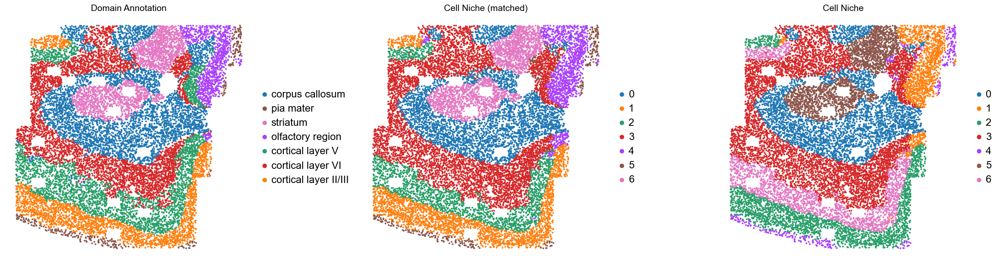

Donor2_Slice1_90wk
ARI:  0.8539, AMI:  0.7972, mF1:  0.7880, wF1:  0.8855


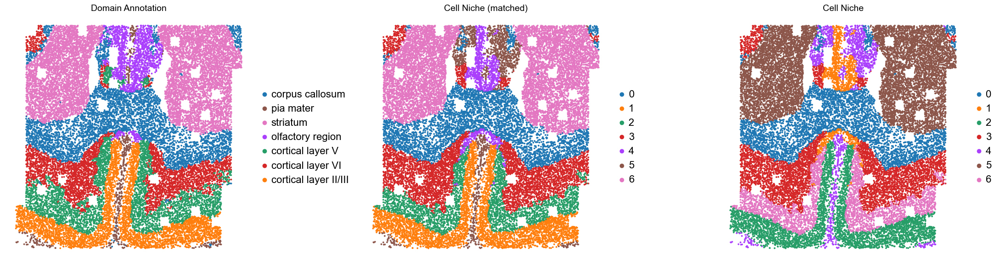

Donor3_Slice0_90wk
ARI:  0.7996, AMI:  0.8033, mF1:  0.8591, wF1:  0.8874


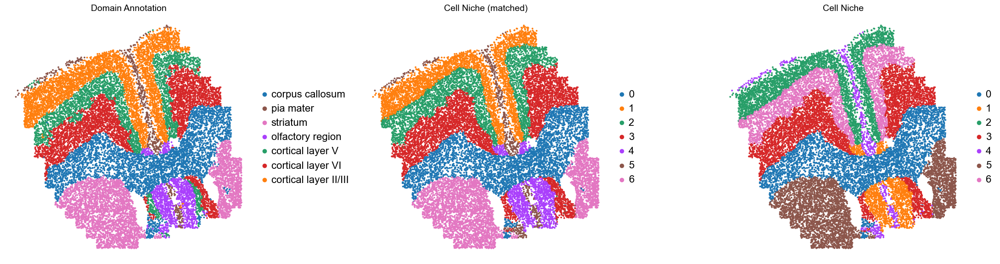

Donor3_Slice1_90wk
ARI:  0.7956, AMI:  0.8052, mF1:  0.7928, wF1:  0.8726


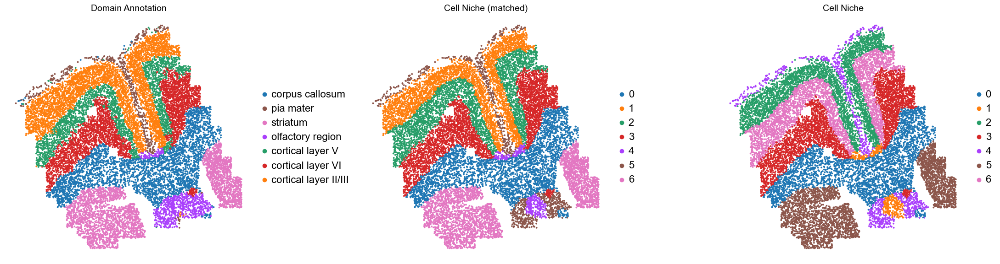

Donor5_Slice0_90wk
ARI:  0.7845, AMI:  0.7752, mF1:  0.8395, wF1:  0.8713


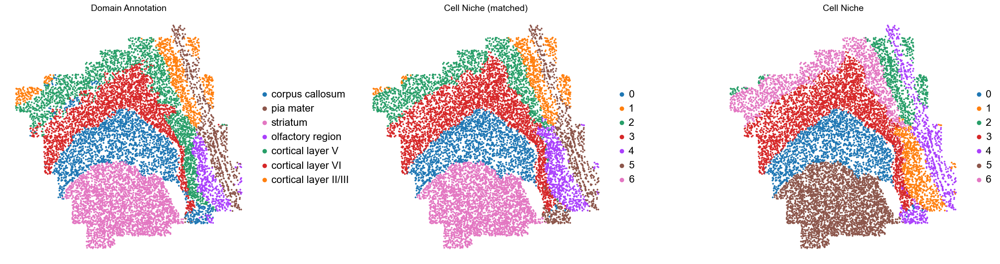

Donor5_Slice1_90wk
ARI:  0.6641, AMI:  0.6510, mF1:  0.8001, wF1:  0.8212


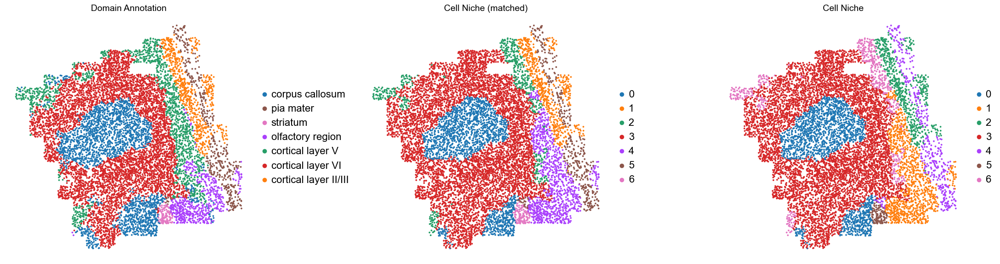

Donor5_Slice2_90wk
ARI:  0.8106, AMI:  0.7679, mF1:  0.7633, wF1:  0.8673


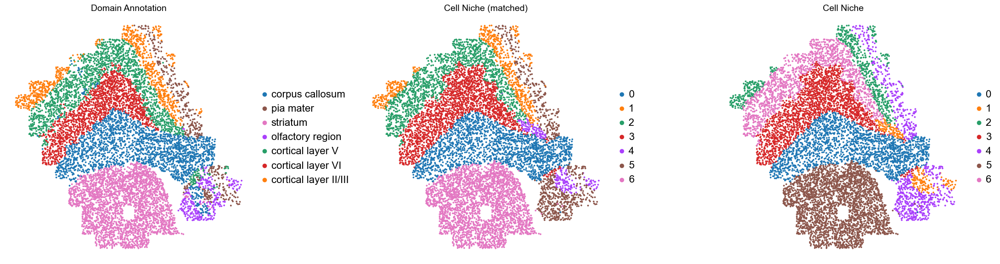

Donor6_Slice0_90wk
ARI:  0.6772, AMI:  0.7347, mF1:  0.8140, wF1:  0.8231


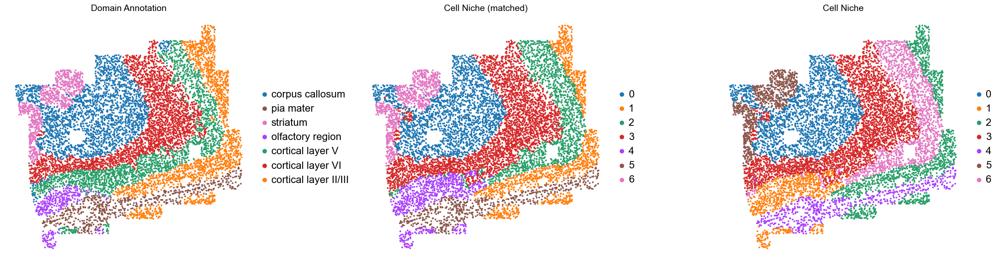

Donor6_Slice1_90wk
ARI:  0.8031, AMI:  0.7639, mF1:  0.7777, wF1:  0.8614


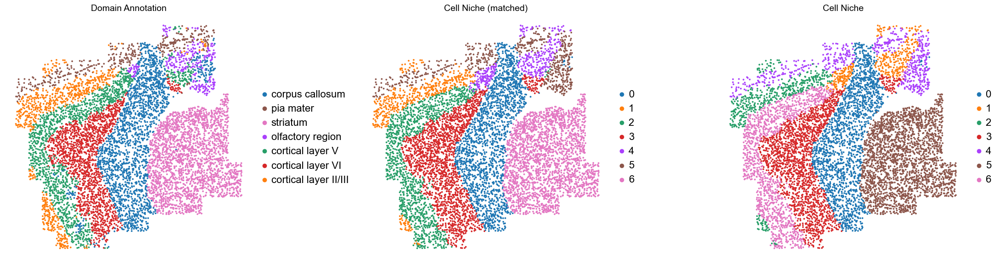

Donor6_Slice2_90wk
ARI:  0.7260, AMI:  0.7446, mF1:  0.8127, wF1:  0.8375


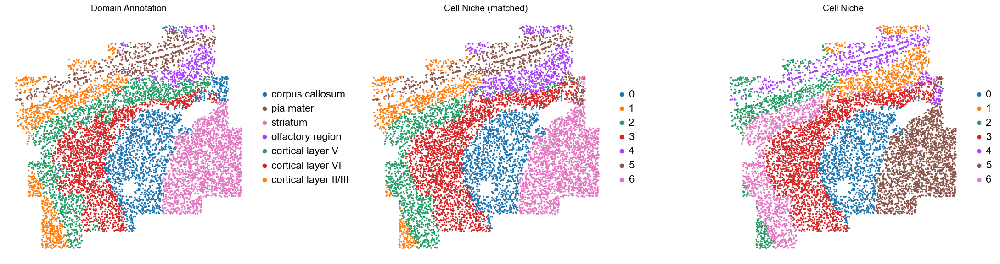

Donor9_Slice0_90wk
ARI:  0.6001, AMI:  0.6768, mF1:  0.7595, wF1:  0.7870


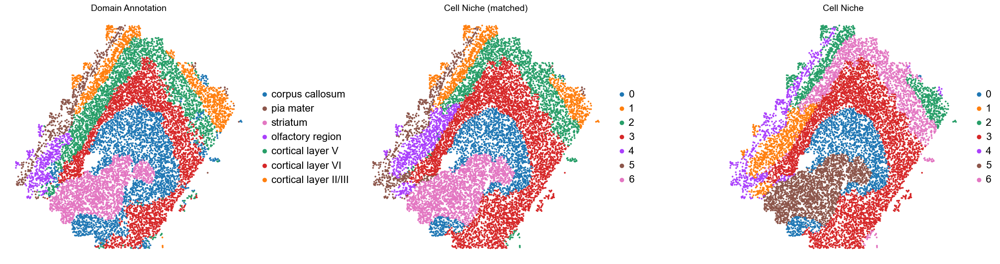

Donor9_Slice1_90wk
ARI:  0.7430, AMI:  0.7447, mF1:  0.7655, wF1:  0.8301


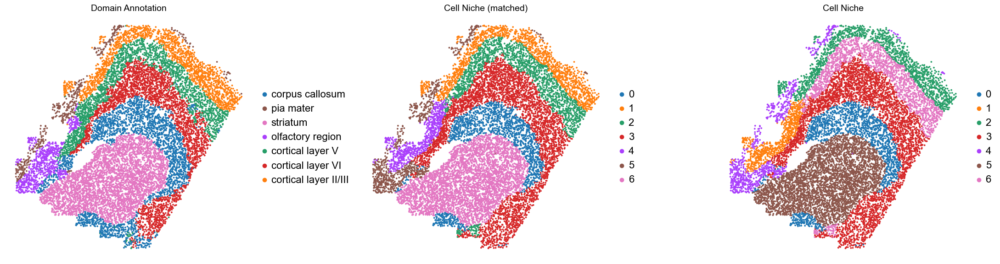

Donor9_Slice2_90wk
ARI:  0.6933, AMI:  0.7009, mF1:  0.7671, wF1:  0.8141


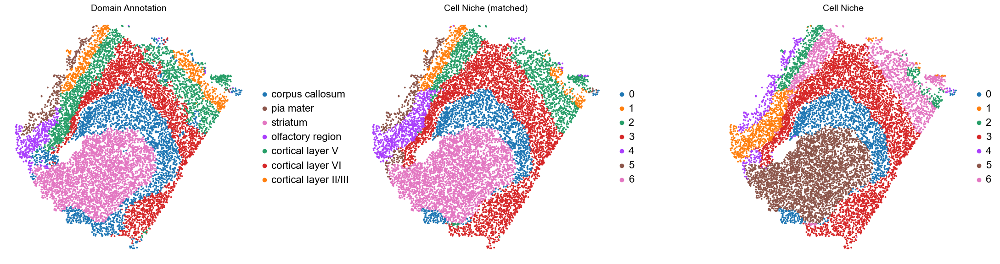

Median: ARI: 0.7430 AMI: 0.7447 mF1: 0.7928 wF1: 0.8554
Mean: ARI: 0.7410 AMI: 0.7464 mF1: 0.7997 wF1: 0.8472


In [9]:
ari_scores = []
ami_scores = []
mf1_scores = []
wf1_scores = []

for i in range(len(adata_list)):
    
    print(slice_name_list[i])
    adata = adata_list[i].copy()

    ari = adjusted_rand_score(adata.obs['domain_annotation'], adata.obs['matched_cluster'])
    ami = adjusted_mutual_info_score(adata.obs['domain_annotation'], adata.obs['matched_cluster'])
    f1_macro = f1_score(adata.obs['domain_annotation'], adata.obs['matched_label'], average='macro')
    f1_weighted = f1_score(adata.obs['domain_annotation'], adata.obs['matched_label'], average='weighted')
    print(f"ARI: {ari: .4f}, AMI: {ami: .4f}, mF1: {f1_macro: .4f}, wF1: {f1_weighted: .4f}")

    ari_scores.append(ari)
    ami_scores.append(ami)
    mf1_scores.append(f1_macro)
    wf1_scores.append(f1_weighted)
    
    fig, axes = plt.subplots(1, 3, figsize=(22, 6))

    sc.pl.embedding(adata, basis='spatial', palette=domain_color_dict, color='domain_annotation', 
                    ax=axes[0], s=30, show=False, frameon=False, title='Domain Annotation', legend_fontsize=16)

    sc.pl.embedding(adata, basis='spatial', palette=niche_color_dict, color='matched_cluster', 
                    ax=axes[1], s=30, show=False, frameon=False, title='Cell Niche (matched)', legend_fontsize=16)

    sc.pl.embedding(adata, basis='spatial', palette=niche_color_dict, color='niche_label', 
                    ax=axes[2], s=30, show=False, frameon=False, title='Cell Niche', legend_fontsize=16)

    # sc.pl.embedding(adata, basis='spatial', palette=ct_color_dict, color='celltype_43', 
    #                 ax=axes[3], s=30, show=False, frameon=False, title='Cell type', legend_fontsize=16)

    plt.tight_layout()
    plt.show()
    
print(f'Median: ARI:{np.median(ari_scores): .4f} AMI:{np.median(ami_scores): .4f} mF1:{np.median(mf1_scores): .4f} wF1:{np.median(wf1_scores): .4f}')
print(f'Mean: ARI:{np.mean(ari_scores): .4f} AMI:{np.mean(ami_scores): .4f} mF1:{np.mean(mf1_scores): .4f} wF1:{np.mean(wf1_scores): .4f}')

#### Cell type composition

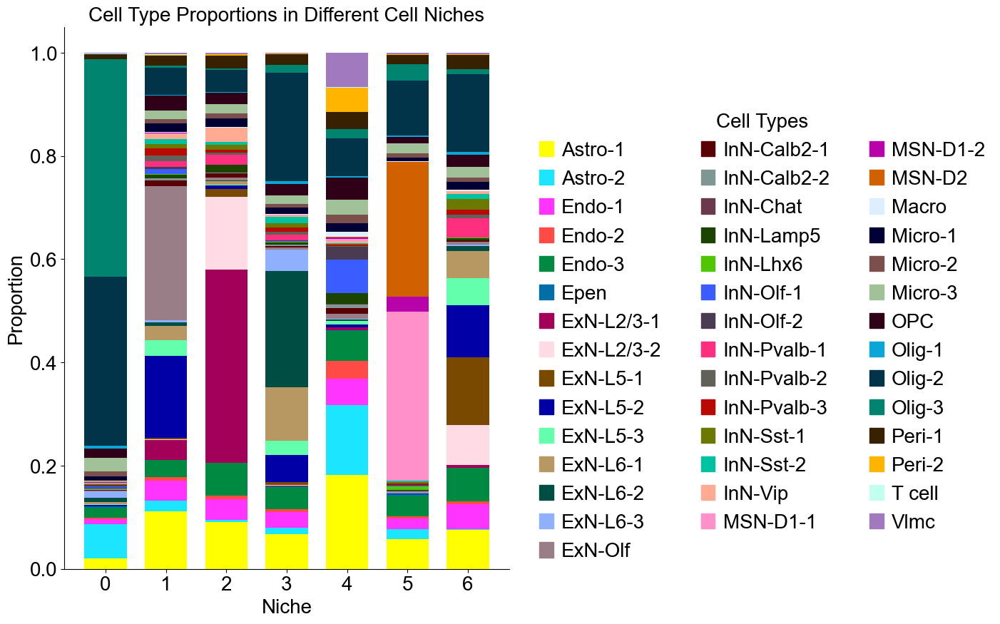

In [10]:
niche_labels = adata_concat_new.uns['niche_label_summary'].copy()
ct_labels = sorted(set(adata_concat_new.obs['celltype_43']))
niche_dist = adata_concat_new.uns['niche_dist'].toarray().copy()
cell_count_niche = adata_concat_new.uns['niche_cell_count'].copy()

fig, ax = plt.subplots(figsize=(8, 10))
bar_width = 0.7
n_niches, n_cell_types = niche_dist.shape

x = np.arange(n_niches)

for j in range(n_cell_types):
    bottom = np.sum(niche_dist[:, :j], axis=1)
    ax.bar(x,                         
           niche_dist[:, j],            
           bottom=bottom,               
           width=bar_width,
           color=ct_color_dict[ct_labels[j]],
           label=ct_labels[j])

ax.set_ylabel('Proportion', fontsize=20)
ax.set_xlabel('Niche', fontsize=20)
ax.set_xticks(x)
ax.set_xticklabels(niche_labels, rotation=0, ha='center')
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(False)

handles = [
    mpatches.Patch(color=color, label=ct)
    for ct, color in zip(celltypes, ct_colors)
]

ax.legend(handles=handles, title='Cell Types', loc=(1.05, 0.0), frameon=False, handleheight=0.8, 
          handlelength=0.7, ncol=3, fontsize=20, title_fontsize=20)

plt.title('Cell Type Proportions in Different Cell Niches', fontsize=20)
plt.tight_layout()
plt.show()

### Cell type enrichment analysis

In [11]:
ct_df = ct_enrichment_test(adata_concat_new.uns['niche_dist'], 
                           adata_concat_new.uns['niche_cell_count'], 
                           adata_concat_new.uns['idx2ct'],
                           adata_concat_new.uns['niche_label_summary'],
                           method='fisher', 
                           alpha=0.05, 
                           fdr_method='fdr_by', 
                           log2fc_threshold=1,
                           prop_threshold=0.01,
                           verbose=True,
                           )
ct_df.head()

7 niches and 43 cell types in total.



,niche_idx,niche,celltype_idx,celltype,oddsratio,p-value,q-value,log2fc,prop,enrichment
0,0,0,0,Astro-1,0.232343,0.000000e+00,0.000000e+00,-2.014527,0.019739,False
1,0,0,1,Astro-2,3.496812,3.295418e-321,1.272466e-319,1.736083,0.066292,True
2,0,0,2,Endo-1,0.306208,6.964037e-120,1.532154e-118,-1.673475,0.010506,False
3,0,0,3,Endo-2,0.353666,4.982655e-23,6.243437e-22,-1.492748,0.002582,False
4,0,0,4,Endo-3,0.400484,4.663302e-120,1.050399e-118,-1.277653,0.019987,False


Plot the results

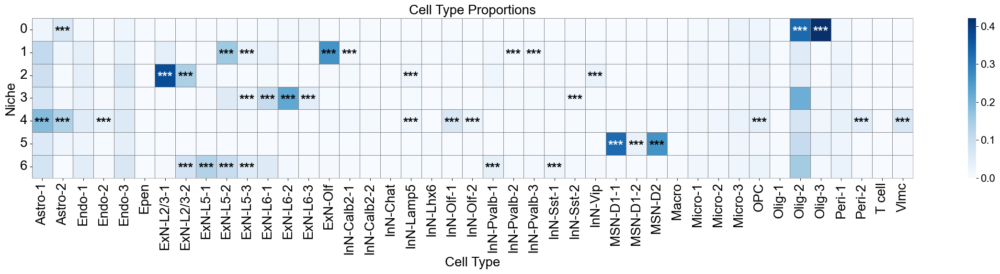

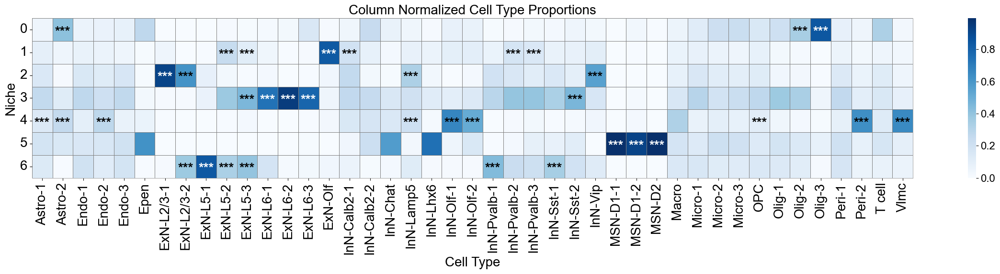

In [12]:
niche_labels = adata_concat_new.uns['niche_label_summary'].copy()
ct_labels = sorted(adata_concat_new.obs['celltype_43'].unique())

matrix_df = pd.DataFrame(
    data=adata_concat_new.uns['niche_dist'].toarray(),
    index=niche_labels,
    columns=ct_labels,
)

cn_dist_count = adata_concat_new.uns['niche_dist'].toarray() * adata_concat_new.uns['niche_cell_count'][:, np.newaxis]
cn_dist_norm = cn_dist_count / np.sum(cn_dist_count, axis=0)
matrix_df_norm = pd.DataFrame(
    data=cn_dist_norm,
    index=niche_labels,
    columns=ct_labels,
)

ct_df['stars'] = ct_df['q-value'].apply(p2stars)

stars_df = pd.DataFrame(
    '', 
    index=matrix_df.index, 
    columns=matrix_df.columns
)

for _, row in ct_df[ct_df['enrichment']].iterrows():
    niche = row['niche']
    ct    = row['celltype']
    if (niche in stars_df.index) and (ct in stars_df.columns):
        stars_df.loc[niche, ct] = row['stars']


fig, axes = plt.subplots(1, 1, figsize=(24, 6))

sns_heatmap_0 = sns.heatmap(
    matrix_df, 
    cmap='Blues', 
    # cbar_kws={'label': 'Cell type proportion'}, 
    linewidths=0.5,
    linecolor='gray',
    # square=True,
    ax=axes
)

for i, niche in enumerate(matrix_df.index):
    for j, ct in enumerate(matrix_df.columns):
        star = stars_df.iloc[i, j]
        if star:
            if matrix_df.iloc[i, j] > np.max(matrix_df.values) * 0.7:
                color='white'
            else:
                color='black'
            axes.text(j + 0.5, i + 0.6, star, ha='center', va='center', color=color, fontsize=20, fontweight='bold')

n_rows, n_cols = matrix_df.shape
axes.plot([0, n_cols], [n_rows, n_rows], color='gray', linewidth=0.5, clip_on=False) 
axes.plot([n_cols, n_cols], [0, n_rows], color='gray', linewidth=0.5, clip_on=False)  

axes.set_xticklabels(axes.get_xticklabels(), rotation=90, ha='center', fontsize=20)
axes.set_yticklabels(axes.get_yticklabels(), rotation=0, ha='right', fontsize=20)
axes.set_ylabel('Niche', fontsize=20)
axes.set_xlabel('Cell Type', fontsize=20)
axes.set_title('Cell Type Proportions', fontsize=20)
axes.collections[0].colorbar.ax.yaxis.label.set_size(20)
axes.collections[0].colorbar.ax.tick_params(labelsize=16)
axes.grid(False)

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 1, figsize=(24, 6))

sns_heatmap_1 = sns.heatmap(
    matrix_df_norm, 
    cmap='Blues', 
    # cbar_kws={'label': 'Cell type proportion'}, 
    linewidths=0.5,
    linecolor='gray',
    # square=True,
    ax=axes
)

for i, niche in enumerate(matrix_df.index):
    for j, ct in enumerate(matrix_df.columns):
        star = stars_df.iloc[i, j]
        if star:
            if matrix_df_norm.iloc[i, j] > np.max(matrix_df_norm.values) * 0.7:
                color='white'
            else:
                color='black'
            axes.text(j + 0.5, i + 0.6, star, ha='center', va='center', color=color, fontsize=20, fontweight='bold')

n_rows, n_cols = matrix_df.shape
axes.plot([0, n_cols], [n_rows, n_rows], color='gray', linewidth=0.5, clip_on=False) 
axes.plot([n_cols, n_cols], [0, n_rows], color='gray', linewidth=0.5, clip_on=False)  

axes.set_xticklabels(axes.get_xticklabels(), rotation=90, ha='center', fontsize=20)
axes.set_yticklabels(axes.get_yticklabels(), rotation=0, ha='right', fontsize=20)
axes.set_ylabel('Niche', fontsize=20)
axes.set_xlabel('Cell Type', fontsize=20)
axes.set_title('Column Normalized Cell Type Proportions', fontsize=20)
axes.collections[0].colorbar.ax.yaxis.label.set_size(20)
axes.collections[0].colorbar.ax.tick_params(labelsize=16)
axes.grid(False)

plt.tight_layout()
plt.show()

### Cell-cell interactions enrichment analysis

In [13]:
cci_results = cci_enrichment_test(adata_list, 
                                  'niche_label', 
                                  'celltype_43', 
                                  niche_summary=adata_concat_new.uns['niche_label_summary'], 
                                  spatial_key='spatial', 
                                  cut_percentage=99,
                                  method='fisher', 
                                  alpha=0.05, 
                                  fdr_method='fdr_by', 
                                  log2fc_threshold=1,
                                  prop_threshold=0.01,
                                  verbose=True,
                                  )
cci_df, test_norm_list, bg_norm_list, test_edge_count_list, bg_edge_count_list = cci_results
cci_df.head()

7 niches and 43 cell types in total.

Testing niche 0...
Testing niche 1...
Testing niche 2...
Testing niche 3...
Testing niche 4...
Testing niche 5...
Testing niche 6...
Finished!


,niche_idx,niche,ct1_idx,ct1,ct2_idx,ct2,test_edge_count,bg_edge_count,test_edge_prop,bg_edge_prop,oddsratio,p-value,q-value,log2fc,enrichment
0,0,0,0,Astro-1,0,Astro-1,50.0,3123.0,0.000626,0.007909,0.078547,1.681858e-179,3.575918e-177,-3.659739,False
1,0,0,1,Astro-2,0,Astro-1,192.0,1646.0,0.002403,0.004168,0.575457,9.510306e-15,3.669606e-13,-0.794665,False
2,0,0,1,Astro-2,1,Astro-2,445.0,956.0,0.005569,0.002421,2.307733,1.121713e-42,8.222038e-41,1.201916,False
3,0,0,2,Endo-1,0,Astro-1,40.0,2554.0,0.000501,0.006468,0.076939,1.104516e-147,2.046955e-145,-3.691493,False
4,0,0,2,Endo-1,1,Astro-2,125.0,601.0,0.001564,0.001522,1.027933,7.659170e-01,1.000000e+00,0.039684,False


Plot the results

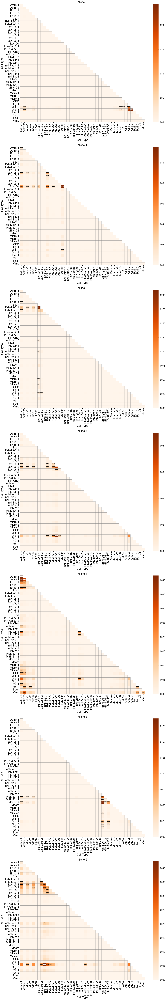

In [14]:
niche_labels = adata_concat_new.uns['niche_label_summary'].copy()
ct_labels = sorted(adata_concat_new.obs['celltype_43'].unique())

cci_df['stars'] = cci_df['q-value'].apply(p2stars)

figrows = 7
figcols = 1

fig, axes = plt.subplots(figrows, figcols, figsize=(18, 100))

for idx in range(figrows * figcols):

    imgrow = idx // figcols
    imgcol = idx % figcols

    if figcols == 1 and figrows == 1:
        ax = axes    
    elif figrows == 1:
        ax = axes[imgcol] 
    elif figcols == 1:
        ax = axes[imgrow]  
    else:
        ax = axes[imgrow, imgcol]   

    if idx >= len(niche_labels):
        ax.axis('off')
        continue

    sub_df = cci_df[cci_df['niche_idx'] == idx]

    matrix_df = pd.DataFrame(
        data=test_norm_list[idx],
        index=ct_labels,
        columns=ct_labels,
    )

    for i in range(matrix_df.shape[0]):
        for j in range(matrix_df.shape[1]):
            if i < j:
                matrix_df.iloc[i, j] = np.nan

    stars_df = pd.DataFrame(
        '', 
        index=matrix_df.index, 
        columns=matrix_df.columns
    )

    for _, row in sub_df[sub_df['enrichment']].iterrows():
        ct1 = row['ct1']
        ct2 = row['ct2']
        if (ct1 in stars_df.index) and (ct2 in stars_df.columns):
            stars_df.loc[ct1, ct2] = row['stars']

    sns_heatmap = sns.heatmap(
        matrix_df, 
        cmap='Oranges', 
        mask=matrix_df.isna(),
        # cbar_kws={'label': 'Edge type proportion'}, 
        # linewidths=0.5,
        # linecolor='gray',
        # square=True,
        ax=ax,
    )

    n_rows, n_cols = matrix_df.shape

    for i, ct1 in enumerate(matrix_df.index):
        ax.plot([0, i+1], [i, i], color='gray', linewidth=0.5, clip_on=False) 
        ax.plot([i+1, i+1], [i, n_rows], color='gray', linewidth=0.5, clip_on=False)
        for j, ct2 in enumerate(matrix_df.columns):
            star = stars_df.iloc[i, j]
            if star:
                if matrix_df.iloc[i, j] > np.nanmax(matrix_df.values) * 0.7:
                    color='white'
                else:
                    color='black'
                ax.text(j + 0.5, i + 0.6, star, ha='center', va='center', color=color, fontsize=20, fontweight='bold')
    
    ax.plot([0, 0], [0, n_rows], color='gray', linewidth=0.5, clip_on=False) 
    ax.plot([0, n_cols], [n_rows, n_rows], color='gray', linewidth=0.5, clip_on=False)  
    # ax.plot([0, n_cols], [n_rows, n_rows], color='gray', linewidth=0.5, clip_on=False) 
    # ax.plot([n_cols, n_cols], [0, n_rows], color='gray', linewidth=0.5, clip_on=False)  

    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='center', fontsize=20)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha='right', fontsize=20)
    ax.set_ylabel('Cell Type', fontsize=20)
    ax.set_xlabel('Cell Type', fontsize=20)
    ax.set_title(f'Niche {niche_labels[idx]}', fontsize=20)
    ax.collections[0].colorbar.ax.yaxis.label.set_size(20)
    ax.collections[0].colorbar.ax.tick_params(labelsize=16)
    ax.grid(False)

plt.tight_layout()
plt.show()

### Niche-niche co-localization analysis

In [15]:
nnc_results = nnc_enrichment_test(adata_list, 
                                  'niche_label', 
                                  niche_summary=adata_concat_new.uns['niche_label_summary'],  
                                  spatial_key='spatial', 
                                  cut_percentage=99, 
                                  method='fisher', 
                                  alpha=0.05, 
                                  fdr_method='fdr_by', 
                                  log2fc_threshold=1,
                                  prop_threshold=0.01, 
                                  verbose=True,
                                  )
nnc_df, edge_prop_mtx, n1_count = nnc_results
nnc_df.head()

7 niches in total.



,niche1_idx,niche1,niche2_idx,niche2,edge_count,edge_prop,oddsratio,p-value,q-value,log2fc,enrichment
0,0,0,1,1,426.0,0.050236,0.431072,6.635801e-72,4.019596e-71,-1.121385,False
1,0,0,2,2,0.0,0.000000,0.000000,0.000000e+00,0.000000e+00,-30.531225,False
2,0,0,3,3,4788.0,0.564623,6.165752,0.000000e+00,0.000000e+00,1.700019,True
3,0,0,4,4,618.0,0.072877,0.562165,8.441829e-44,4.261323e-43,-0.751286,False
4,0,0,5,5,2610.0,0.307783,22.113316,0.000000e+00,0.000000e+00,3.964860,True


Plot the results

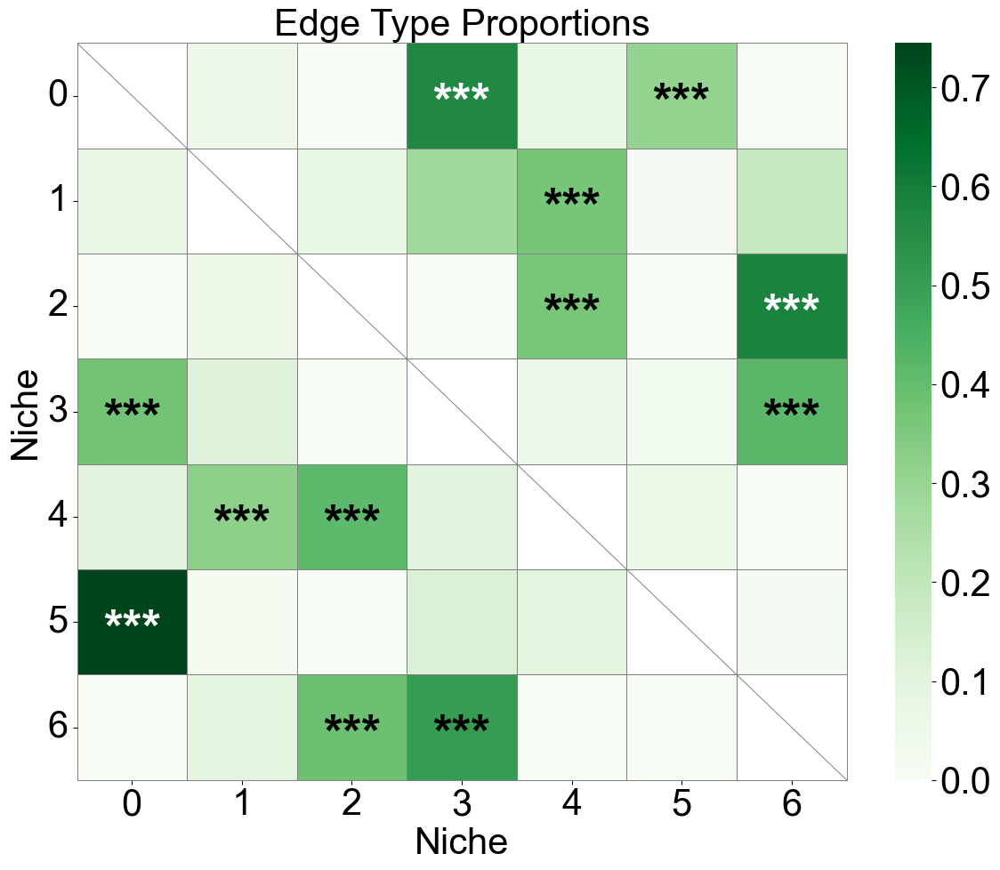

In [16]:
niche_labels = adata_concat_new.uns['niche_label_summary'].copy()

nnc_df['stars'] = nnc_df['q-value'].apply(p2stars)

matrix_df = pd.DataFrame(
    data=edge_prop_mtx,
    index=niche_labels,
    columns=niche_labels,
)

for i in range(matrix_df.shape[0]):
    for j in range(matrix_df.shape[1]):
        if i == j:
            matrix_df.iloc[i, j] = np.nan

stars_df = pd.DataFrame(
    '', 
    index=matrix_df.index, 
    columns=matrix_df.columns
)

for _, row in nnc_df[nnc_df['enrichment']].iterrows():
    n1 = row['niche1']
    n2 = row['niche2']
    if (n1 in stars_df.index) and (n2 in stars_df.columns):
        stars_df.loc[n1, n2] = row['stars']

plt.figure(figsize=(12, 10))

ax  = sns.heatmap(
    matrix_df, 
    cmap='Greens', 
    # cbar_kws={'label': 'Edge type proportion'}, 
    linewidths=0.7,
    linecolor='gray',
    # square=True,
)

for i, n1 in enumerate(matrix_df.index):
    for j, n2 in enumerate(matrix_df.columns):
        if i == j:
            ax.plot([i, i+1], [i, i+1], color='gray', linewidth=0.7)
            # ax.plot([i+1, i], [i, i+1], color='gray', linewidth=0.7)
            continue
        star = stars_df.iloc[i, j]
        if star:
            if matrix_df.iloc[i, j] > np.nanmax(matrix_df.values) * 0.7:
                color='white'
            else:
                color='black'
            ax.text(j + 0.5, i + 0.6, star, ha='center', va='center', color=color, fontsize=40, fontweight='bold')

n_rows, n_cols = matrix_df.shape
ax.plot([0, n_cols], [n_rows, n_rows], color='gray', linewidth=0.7, clip_on=False) 
ax.plot([n_cols, n_cols], [0, n_rows], color='gray', linewidth=0.7, clip_on=False)  

ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='center', fontsize=30)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, ha='right', fontsize=30)
ax.set_ylabel('Niche', fontsize=30)
ax.set_xlabel('Niche', fontsize=30)
ax.set_title('Edge Type Proportions', fontsize=30)
ax.collections[0].colorbar.ax.yaxis.label.set_size(30)
ax.collections[0].colorbar.ax.tick_params(labelsize=30)
ax.grid(False)

plt.tight_layout()
plt.show()